# Visualization of holomorphic functions with Python

Source: 

  - Title:   Scientific Visualisation - Python & Matplotlib
  - Author:  Nicolas P. Rougier
  - URL:     https://github.com/rougier/scientific-visualization-book
  - License: BSD

TODO:
  - plots & contours
  - start 3D plots with real and imag, urk, not very useful.
  - vectorisation
  - tricks with integer (non-labelled) contours
  - exploration with real, imag. Use IFT & conformal transform to explain what we see (90° angles) ?
  - then modulus, log-modulus, angle, etc.

In [1]:
import time

In [2]:
from numpy import (angle, clip, cos, exp, linspace, log, log2, logspace, meshgrid, ones_like, pi, round, shape, sqrt, sin, vectorize, zeros)
from matplotlib import colormaps
from matplotlib.pyplot import (axis, clf, contour, figure, fill, gca, grid, plot, quiver, savefig, streamplot, subplots, subplots_adjust, xlim, ylim)
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image
import colorspacious

## Paths & Winding Number

In [3]:
def path_concat(*paths):
    @vectorize
    def path(t):
        n = len(paths)
        i = int(n * t)
        s = n * t - i
        if s == 0.0 and i > 0:
            i, s = i - 1, 1.0
        return paths[i](s)
    return path

def path_plot(path, n=1000, *args, **kwargs):
    t = linspace(0.0, 1.0, n)
    path_t = path(t)
    plot(path_t.real, path_t.imag, *args, **kwargs)
        

In [4]:
def circle(c=0j, r=1.0, arg0=0.0, arg1=2*pi):
    def gamma(t):
        return r * exp(1j * (arg0 + (arg1-arg0) * t)) + c

    return gamma


def line(z0=0, z1=1):
    def gamma(t):
        return (1 - t) * z0 + t * z1

    return gamma


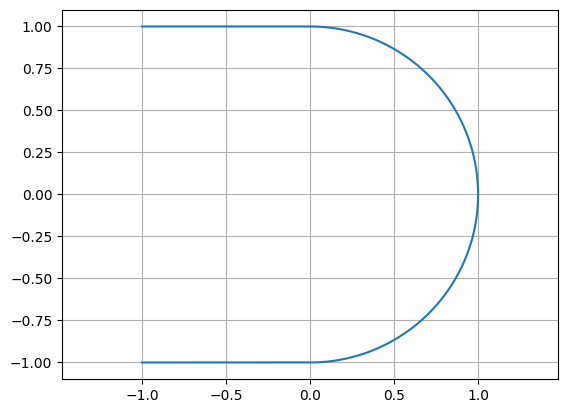

In [5]:
path = path_concat(
    line(-1-1j, -1j),
    circle(arg0=-pi/2, arg1=pi/2),
    line(1j, 1j-1)
)
path_plot(path)
axis("equal")
grid(True)

In [6]:
def integral(f, path, n=1000):
    t = linspace(0.0, 1.0, n, endpoint=False)
    dt = 1.0 / n
    path_t = path(t)
    dpath_t = path(t+dt) - path(t)
    return sum(f(path(t)) * dpath_t)



In [7]:
def f(z):
    return 1.0 / z

integral(f, circle()) / (2*pi*1j)

np.complex128(0.9999934202767068+0.003141582318177826j)

In [8]:
def arg_var(path, a=0.0, n=1000):
    def f(z):
        return 1.0 / (z - a)
    i = integral(f, path, n)
    return i.imag

def winding_number(path, a=0.0, n=1000):
    # Assumption: the path is closed
    w = arg_var(path, a, n)
    return int(round(w / (2*pi)))

In [9]:
winding_number(circle())

1

In [10]:
winding_number(circle(arg1=6*pi))

3

In [11]:
winding_number(circle(c=0.5))

1

In [12]:
winding_number(circle(c=-1.5))

0

(np.float64(-1.1), np.float64(1.1), np.float64(-1.1), np.float64(1.1))

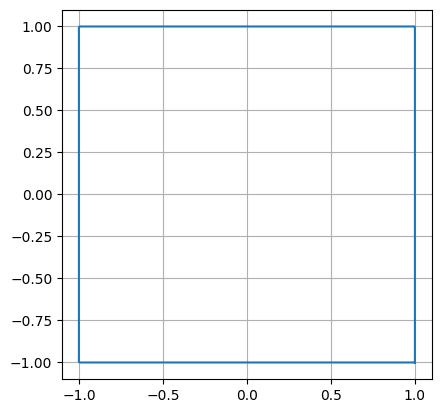

In [13]:
square = path_concat(
    line(1 - 1j, 1 + 1j),
    line(1 + 1j, -1 + 1j),
    line(-1 + 1j, -1 - 1j),
    line(-1 - 1j, 1 - 1j),
)

t = linspace(0.0, 1.0, 1000)
square_t = square(t)
plot(square_t.real, square_t.imag)
grid(True)
axis("square")


In [14]:
winding_number(square)

1

In [15]:
winding_number(path_concat(square, square))

2

In [16]:
winding_number(lambda t: square(1.0 - t))

-1

In [17]:
winding_number(square, a=0.95+0.95j)

1

In [18]:
winding_number(square, a=1.05+0.95j)

0

## Conformal Mappings

In [19]:
def grid(xs, ys):
    paths = []
    x_min, x_max = xs[0], xs[-1]
    y_min, y_max = ys[0], ys[-1]
    for x in xs:
        paths.append(line(x+1j*y_min, x+1j*y_max))
    for y in ys:
        paths.append(line(x_min+1j*y, x_max+1j*y))
    return paths

def polar_grid(rs, thetas, c=0.0+0.0j):
    paths = []
    r_min, r_max = rs[0], rs[-1]
    theta_min, theta_max = thetas[0], thetas[-1]
    
    for r in rs:
        paths.append(circle(r=r, arg0=theta_min, arg1=theta_max, c=c))
    for theta in thetas:
        paths.append(line(r_min*exp(1j*theta)+c, r_max*exp(1j*theta)+c))
    return paths

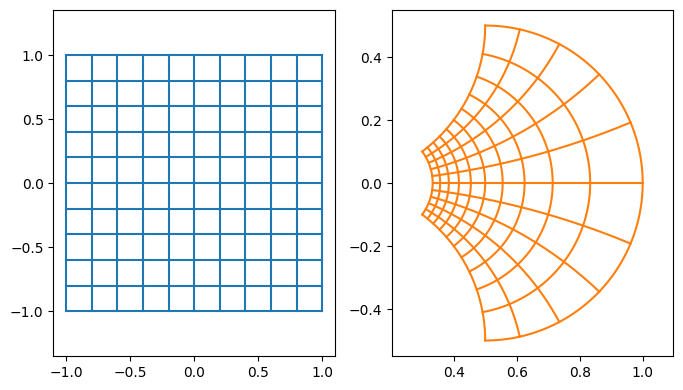

In [20]:
def f(z):
    return 1/(z+2)


paths = grid(xs=linspace(-1,1, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, (ax1, ax2) = subplots(1, 2, figsize=(8, 4.5))
for path in paths:
    path_t = path(t)
    f_path_t = f(path_t)
    ax1.plot(path_t.real, path_t.imag, color="C0")
    ax2.plot(f_path_t.real, f_path_t.imag, color="C1")

ax1.axis("equal")
ax2.axis("equal")
None

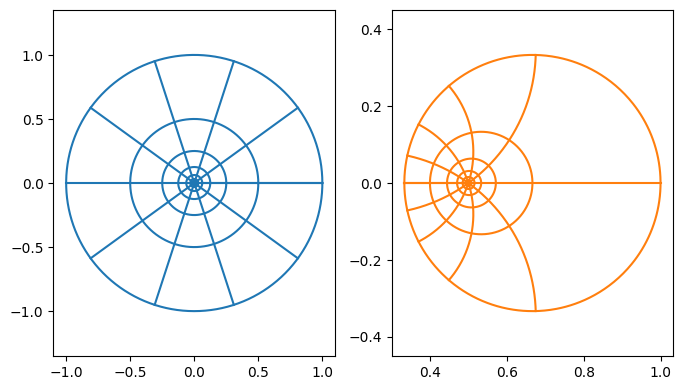

In [21]:
def f(z):
    return 1/(z+2)


paths = polar_grid(rs=logspace(-10, 0, 11, base=2), thetas=linspace(0, 2*pi, 11))

t = linspace(0.0, 1.0, 1000)
fig, (ax1, ax2) = subplots(1, 2, figsize=(8, 4.5))
for path in paths:
    path_t = path(t)
    f_path_t = f(path_t)
    ax1.plot(path_t.real, path_t.imag, color="C0")
    ax2.plot(f_path_t.real, f_path_t.imag, color="C1")

ax1.axis("equal")
ax2.axis("equal")
None

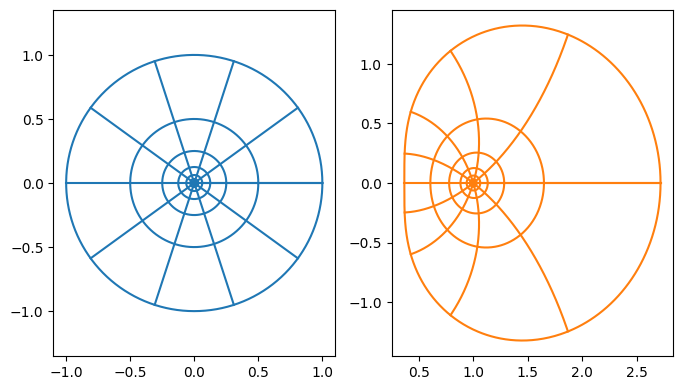

In [22]:
def f(z):
    return exp(z)


paths = polar_grid(rs=logspace(-10, 0, 11, base=2), thetas=linspace(0, 2*pi, 11))

t = linspace(0.0, 1.0, 1000)
fig, (ax1, ax2) = subplots(1, 2, figsize=(8, 4.5))
for path in paths:
    path_t = path(t)
    f_path_t = f(path_t)
    ax1.plot(path_t.real, path_t.imag, color="C0")
    ax2.plot(f_path_t.real, f_path_t.imag, color="C1")

ax1.axis("equal")
None

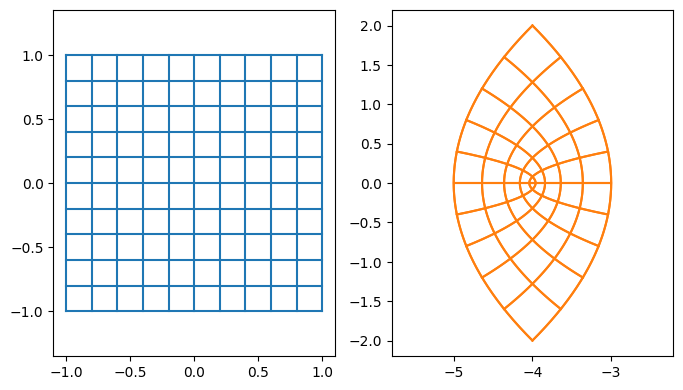

In [23]:
def f(z):
    return (z-2)*(z+2)
paths = grid(xs=linspace(-1,1, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, (ax1, ax2) = subplots(1, 2, figsize=(8, 4.5))
for path in paths:
    path_t = path(t)
    f_path_t = f(path_t)
    ax1.plot(path_t.real, path_t.imag, color="C0")
    ax2.plot(f_path_t.real, f_path_t.imag, color="C1")

ax1.axis("equal")
ax2.axis("equal")
None

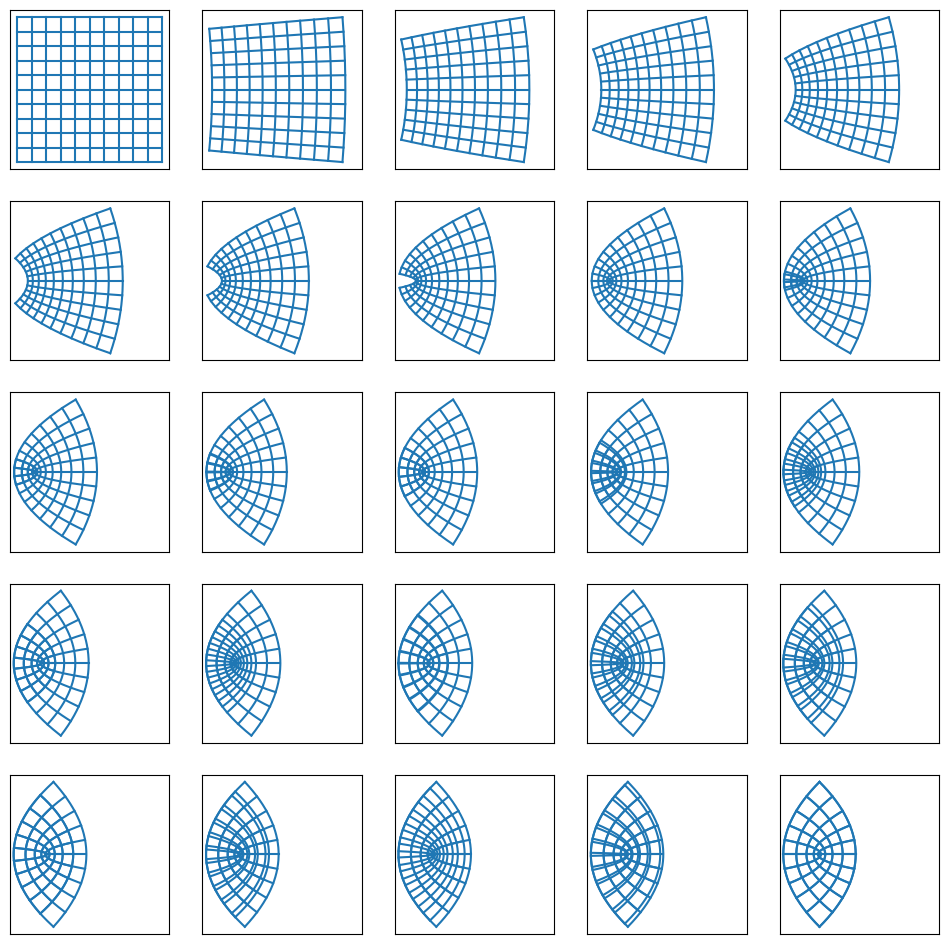

In [24]:
def f(z):
    return (z-0.5)*(z+0.5)
paths = grid(xs=linspace(-1,1, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(5, 5, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

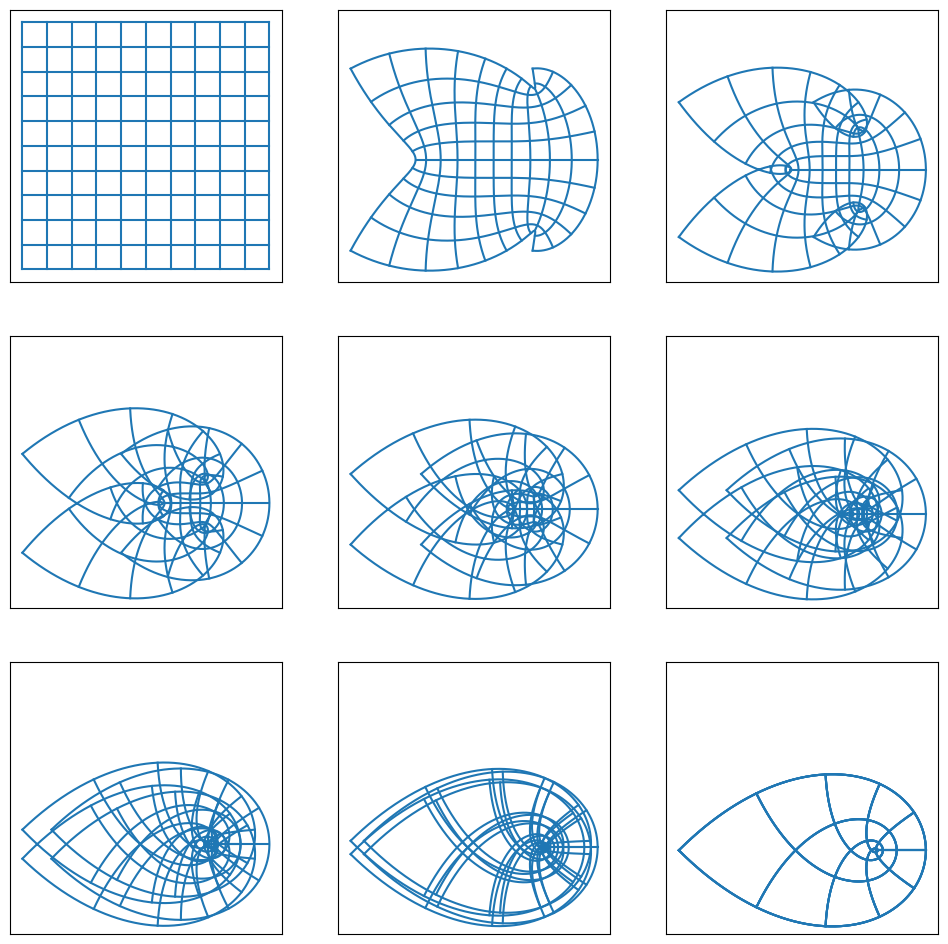

In [25]:
def f(z):
    return z**4
paths = grid(xs=linspace(-1,1, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(3, 3, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

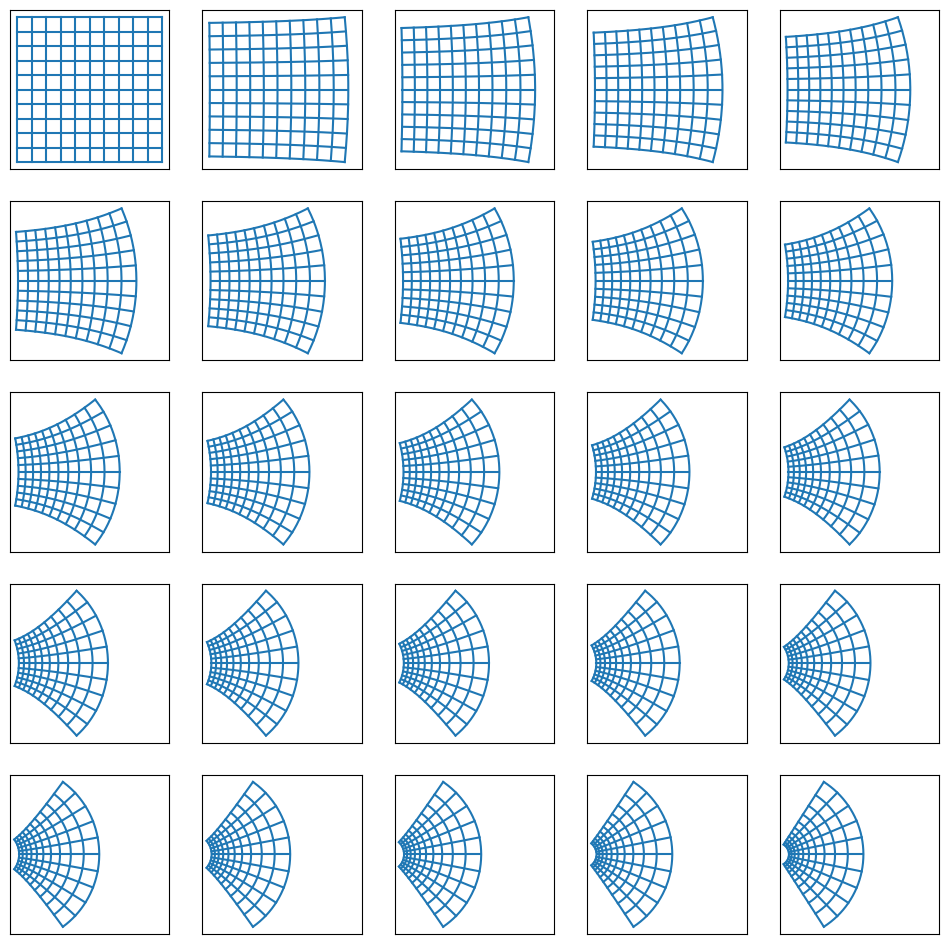

In [26]:
def f(z):
    return exp(z)
paths = grid(xs=linspace(-1,1, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(5, 5, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

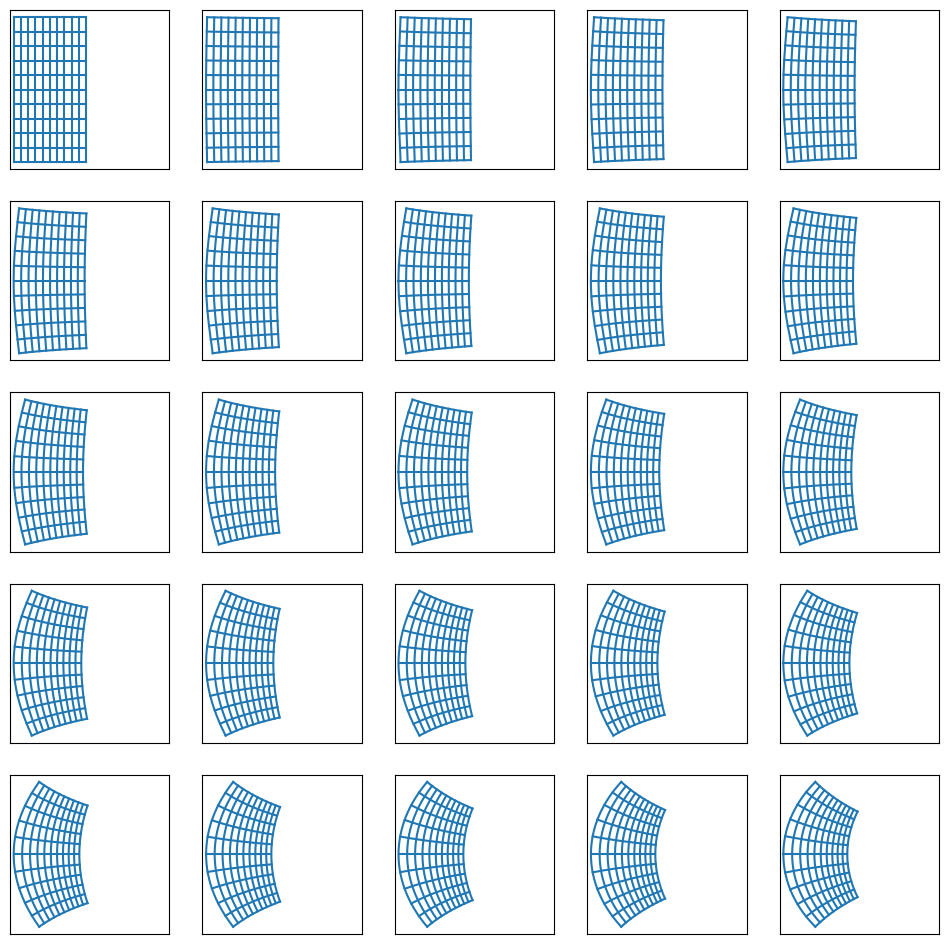

In [27]:
def f(z):
    return log(z)
paths = grid(xs=linspace(1,2, 11), ys=linspace(-1, 1, 11))

t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(5, 5, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

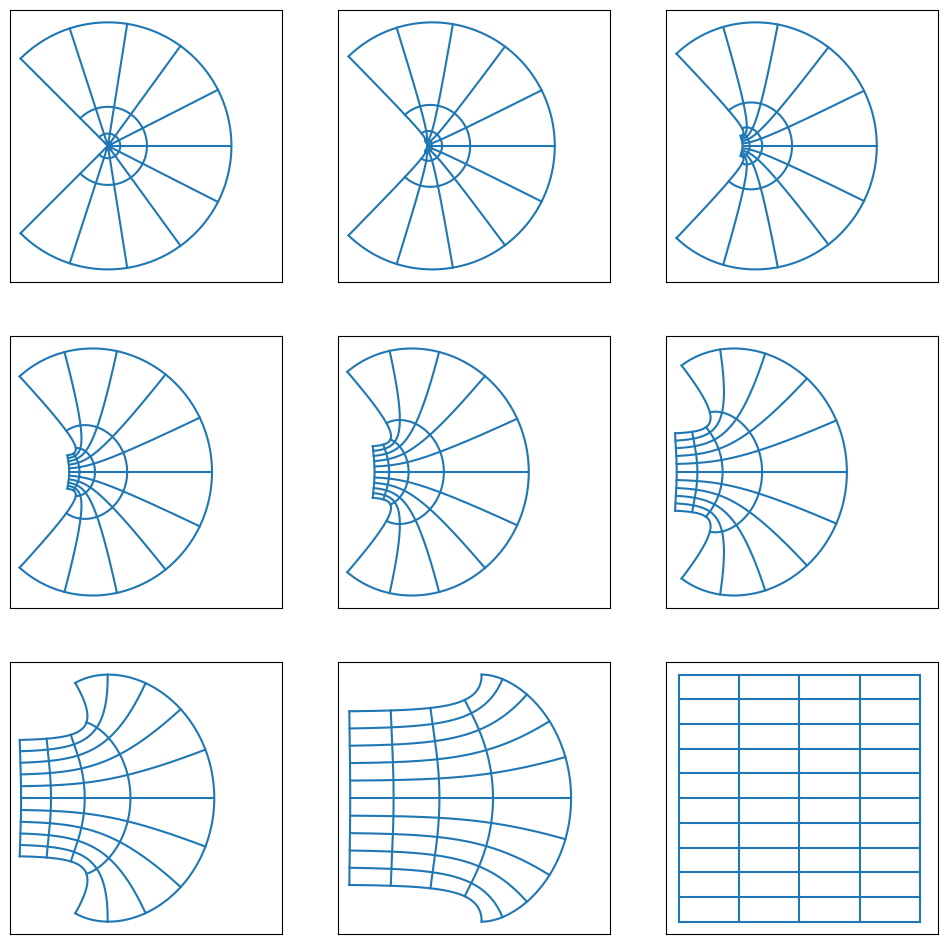

In [28]:
def f(z):
    return log(z)

paths = polar_grid(rs=logspace(-1,1, 5), thetas=linspace(-3*pi/4, 3*pi/4, 11))
t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(3, 3, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

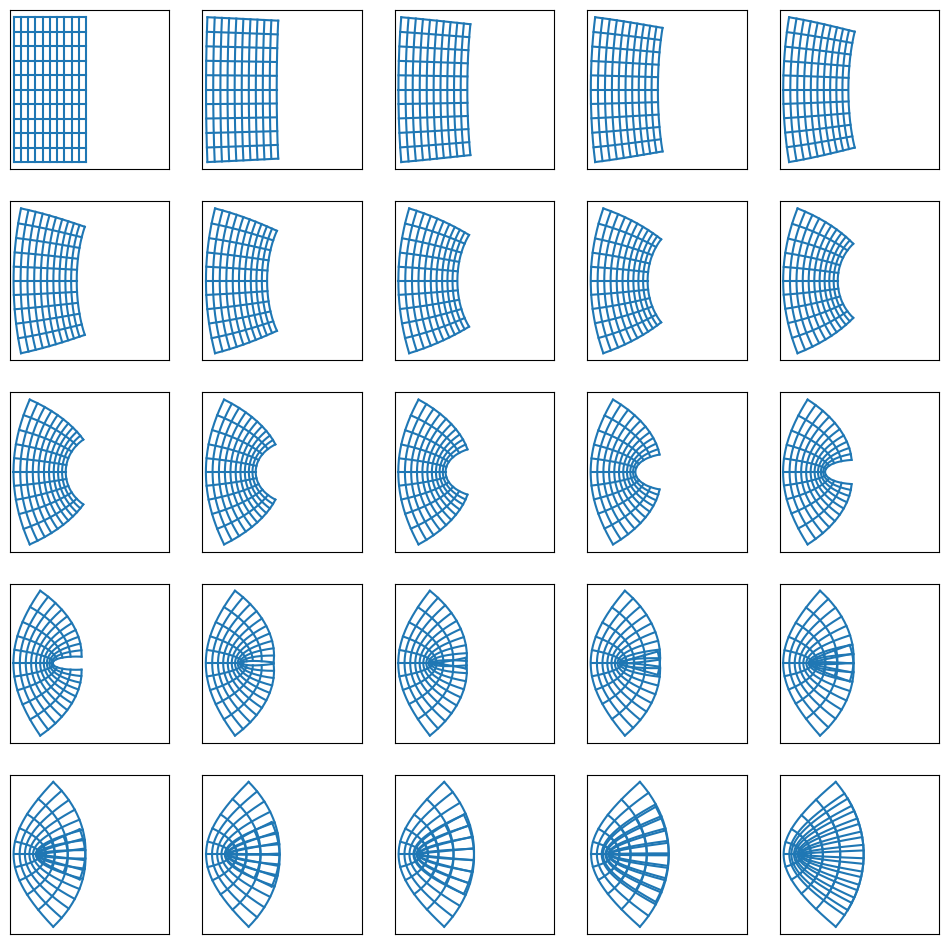

In [29]:
def f(z):
    return sin(z)
paths = grid(xs=linspace(1,2, 11), ys=linspace(-1, 1, 11))
t = linspace(0.0, 1.0, 1000)
fig, axes = subplots(5, 5, figsize=(12, 12))
axes = [ax for l in axes for ax in l]
for i, ax in enumerate(axes):
    for path in paths:
        path_t = path(t)
        alpha = i / (len(axes) - 1)
        f_path_t = (1- alpha) * path_t + alpha * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="C0")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")

None

# Animations

CPU times: user 4.87 s, sys: 263 ms, total: 5.14 s
Wall time: 5.14 s


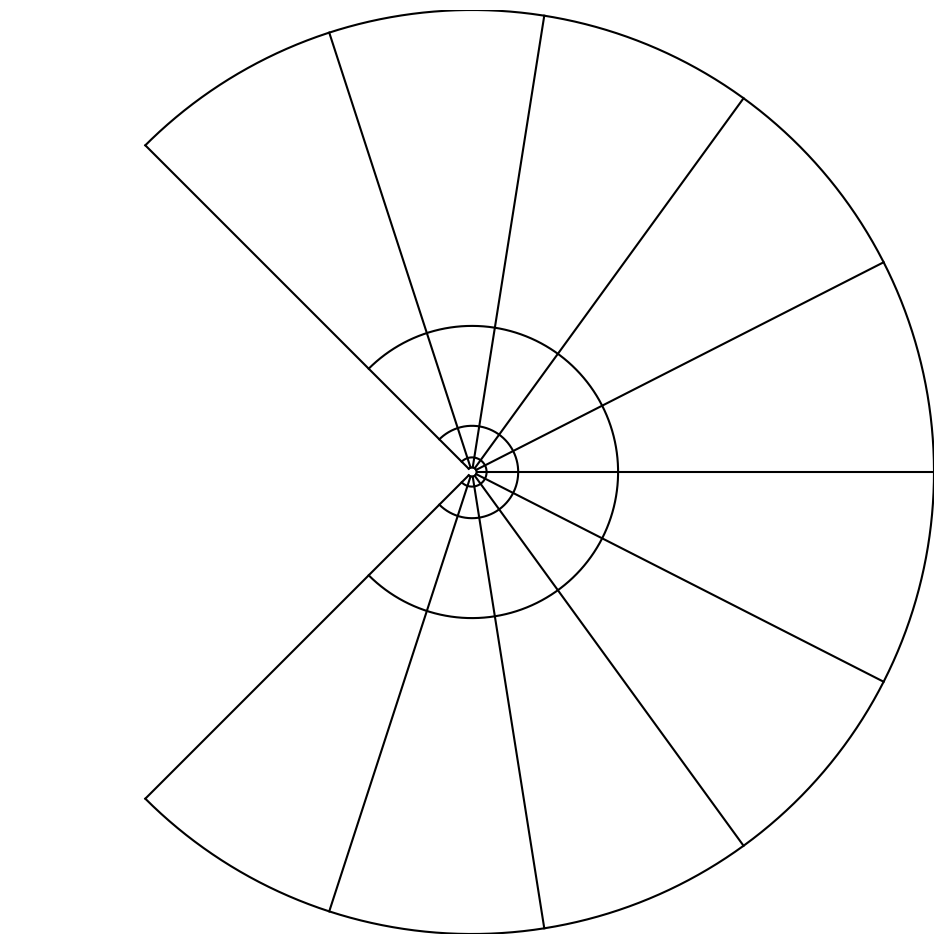

In [30]:
%%time
def f(z):
    return log(z)

paths = polar_grid(rs=logspace(-1,1, 5), thetas=linspace(-3*pi/4, 3*pi/4, 11))

T = 5.0
FPS = 24
ss = linspace(-0.5, 1.5, 3*24)

fig, ax = subplots(figsize=(12, 12))

import time

def func(s):
    ax.clear()
    for path in paths:
        path_t = path(t)
        s = clip(s, 0.0, 1.0)
        f_path_t = (1- s) * path_t + s * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="k")
        ax.set_xticks([]); ax.set_yticks([])
        ax.axis("square")
        ax.set_xlim([-10, 10])
        ax.set_ylim([-10, 10])
        ax.axis("off")

writer = PillowWriter(fps=FPS)
anim = FuncAnimation(fig, func, frames=ss)
anim.save("movie.gif", writer=writer)
None

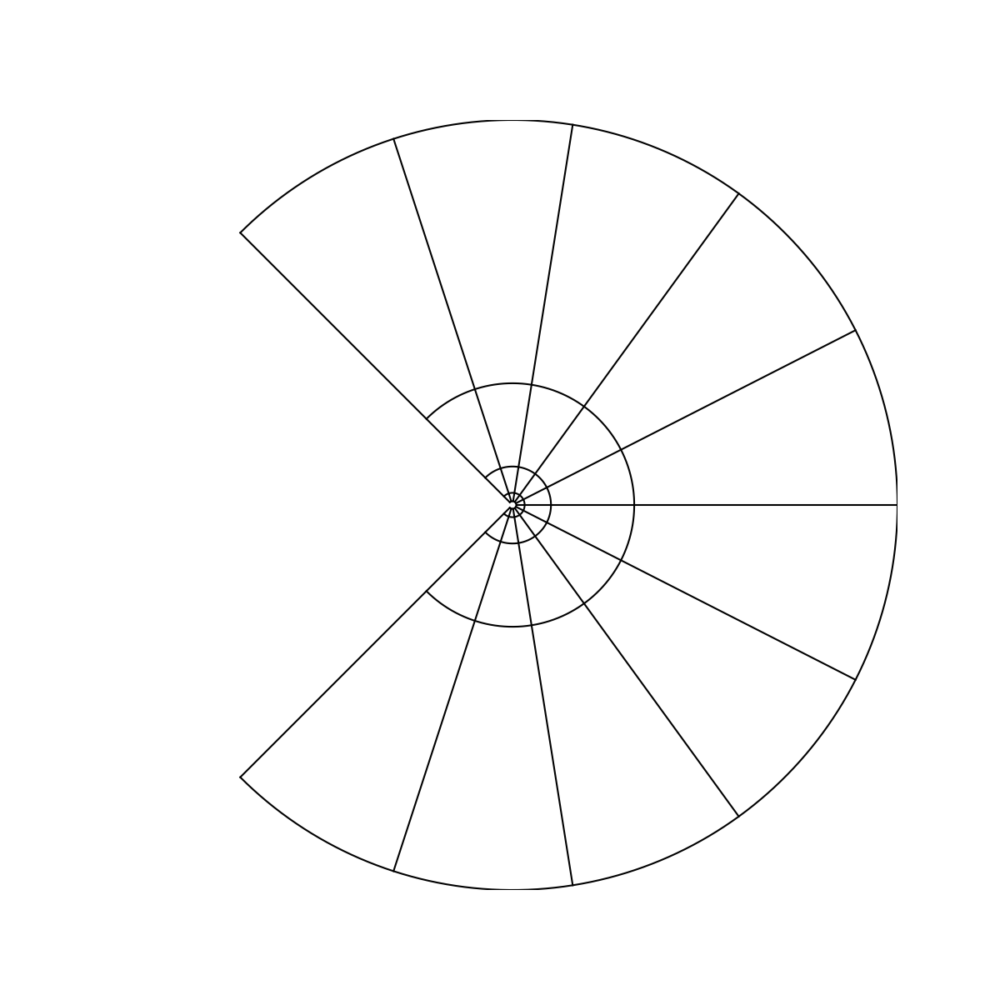

In [31]:
Image("movie.gif", width=640)

## Joukowsky

The circle is always the unit centered circle, the J transform is parametric and adjusts.

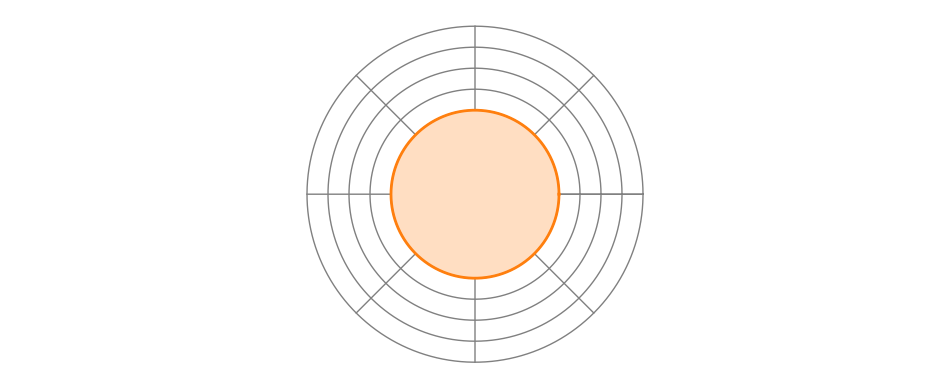

In [32]:
gamma = circle()
paths = polar_grid(rs=linspace(1.0, 2.0, 5), thetas=linspace(0, 2*pi, 8+1))


fig, axes = subplots()
fig.set_figwidth(12)
t = linspace(0.0, 1.0, 10000)

color = "C1"
for path in paths:
    path_t = path(t)
    axes.plot(path_t.real, path_t.imag, color="grey", lw=1)
    
axes.fill(gamma(t).real, gamma(t).imag, color=color, alpha=0.25)
axes.plot(gamma(t).real, gamma(t).imag, color=color, lw=2)
# axes.plot(+1.0, 0, ".", color=color, ms=12)
# axes.plot(-1.0, 0, ".", color=color, ms=12)

axes.set_xticks([]); ax1.set_yticks([])
axes.axis("equal")
axes.axis("off")

None


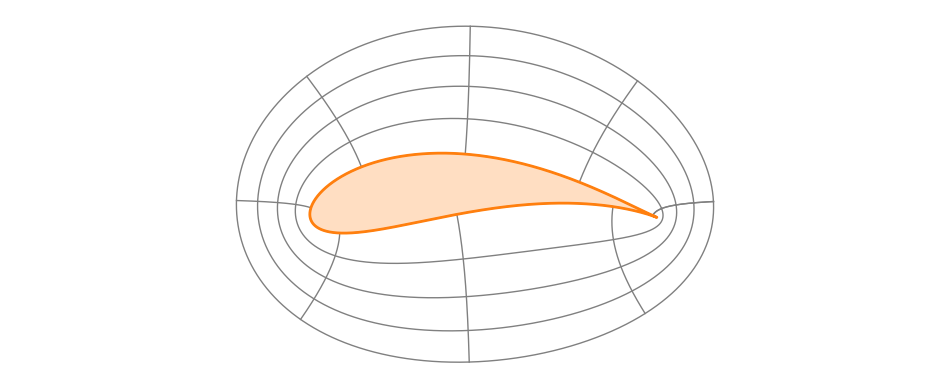

In [33]:
a = 1.2 # * exp(-pi/16*1j) # pick any a with |a| >= 1 and any arg (small and negative the better). See the influence.
theta = -pi / 16
b = 1 - a*exp(1j*theta) # This is forced by the constraint that J(1) = 1. (Note: yields J'(1)= 0, which is good wrt the pinch !)

def Joukowsky(z):
    w = a * z + b
    return 0.5 * (w + 1.0 / w)

J = Joukowsky

gamma = circle()
J_gamma = lambda t: J(gamma(t))

fig, ax = subplots()
fig.set_figwidth(12)
color = "C1"
for path in paths:
    J_path_t = J(path(t))
    ax.plot(J_path_t.real, J_path_t.imag, color="grey", lw=1)
ax.plot(J_gamma(t).real, J_gamma(t).imag, color=color, lw=2)
ax.fill(J_gamma(t).real, J_gamma(t).imag, color=color, alpha=0.25)
# ax.plot(1.0, 0.0, ".", color=color, ms=12, label="1")
# ax.plot(-1.0, 0.0, ".", color=color, ms=12, label="-1")
ax.set_xticks([]); ax2.set_yticks([])
ax.axis("equal")
ax.axis("off")

None

CPU times: user 10.7 s, sys: 52.8 ms, total: 10.7 s
Wall time: 10.7 s


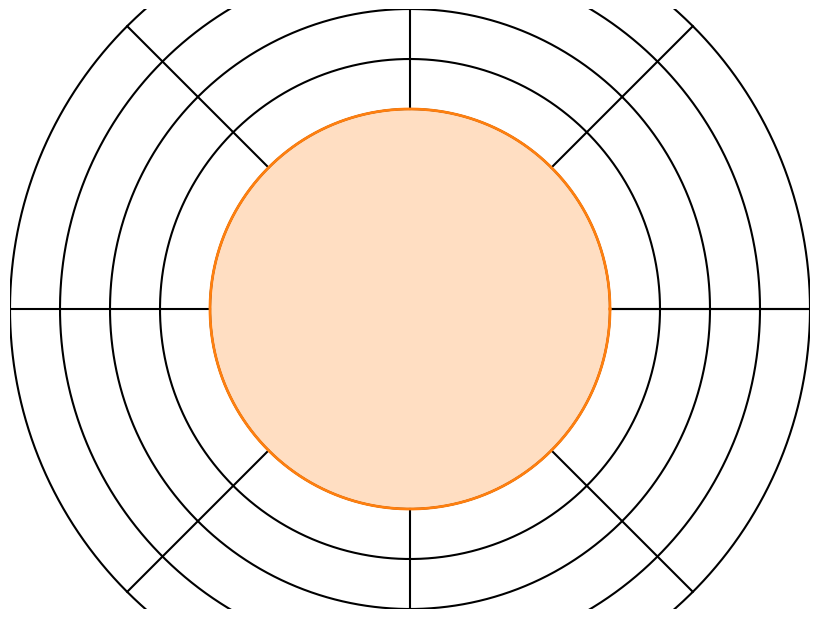

In [34]:
%%time
a = 1.2 # * exp(-pi/16*1j) # pick any a with |a| >= 1 and any arg (small and negative the better). See the influence.
theta = -pi / 16
b = 1 - a*exp(1j*theta) # This is forced by the constraint that J(1) = 1. (Note: yields J'(1)= 0, which is good wrt the pinch !)

def Joukowsky(z):
    w = a * z + b
    return 0.5 * (w + 1.0 / w)

f = J = Joukowsky

paths = polar_grid(rs=linspace(1.0, 2.0, 5), thetas=linspace(0, 2*pi, 8+1))

FPS = 24
ss = linspace(0.0-1.0, 3.0+1.0, 3*24)

fig, ax = subplots(figsize=(8, 6))

def func(s):
    ax.clear()
    for path in paths:
        path_t = path(t)
        sr = clip(s, 0.0, 3.0) / 3.0
        f_path_t = (1- sr) * path_t + sr * f(path_t)
        ax.plot(f_path_t.real, f_path_t.imag, color="k")
        ax.set_xticks([]); ax.set_yticks([])
    path = paths[0]
    path_t = path(t)
    sr = clip(s, 0.0, 3.0) / 3.0
    f_path_t = (1- sr) * path_t + sr * f(path_t)
    ax.plot(f_path_t.real, f_path_t.imag, color=color, lw=2)
    ax.fill(f_path_t.real, f_path_t.imag, color=color, alpha=0.25)
    
    ax.axis("square")
    ax.set_xlim([-2, 2])
    ax.set_ylim([-1.5, 1.5])
    subplots_adjust(left=0, bottom=0, right=1, top=1)
    ax.axis("off")

writer = PillowWriter(fps=FPS)
anim = FuncAnimation(fig, func, frames=ss)
anim.save("Joukowsky.gif", writer=writer)
None

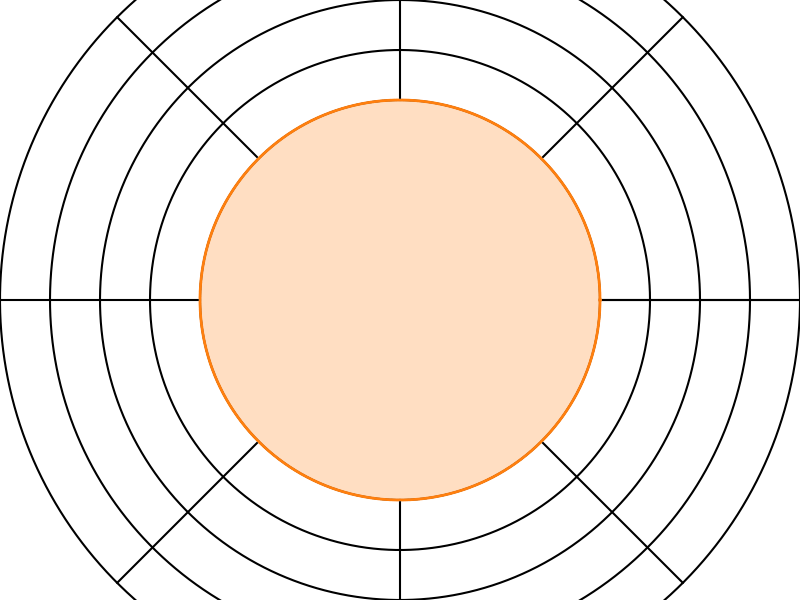

In [35]:
Image("Joukowsky.gif", width=640)

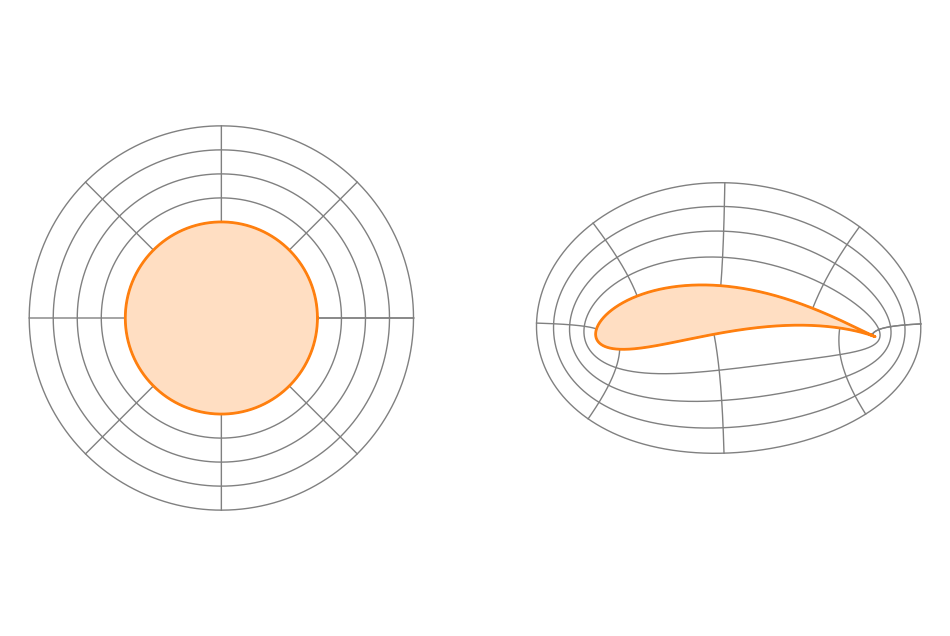

In [36]:
gamma = circle()
paths = polar_grid(rs=linspace(1.0, 2.0, 5), thetas=linspace(0, 2*pi, 8+1))


fig, (ax1, ax2) = subplots(1, 2, figsize=(12, 8))
t = linspace(0.0, 1.0, 10000)

axes = ax1
color = "C1"
for path in paths:
    path_t = path(t)
    axes.plot(path_t.real, path_t.imag, color="grey", lw=1)
    
axes.fill(gamma(t).real, gamma(t).imag, color=color, alpha=0.25)
axes.plot(gamma(t).real, gamma(t).imag, color=color, lw=2)
# axes.plot(+1.0, 0, ".", color=color, ms=12)
# axes.plot(-1.0, 0, ".", color=color, ms=12)

ax = ax2

a = 1.2 # * exp(-pi/16*1j) # pick any a with |a| >= 1 and any arg (small and negative the better). See the influence.
theta = -pi / 16
b = 1 - a*exp(1j*theta) # This is forced by the constraint that J(1) = 1. (Note: yields J'(1)= 0, which is good wrt the pinch !)

def Joukowsky(z):
    w = a * z + b
    return 0.5 * (w + 1.0 / w)

J = Joukowsky

gamma = circle()
J_gamma = lambda t: J(gamma(t))

color = "C1"
for path in paths:
    J_path_t = J(path(t))
    ax.plot(J_path_t.real, J_path_t.imag, color="grey", lw=1)
ax.plot(J_gamma(t).real, J_gamma(t).imag, color=color, lw=2)
ax.fill(J_gamma(t).real, J_gamma(t).imag, color=color, alpha=0.25)
# ax.plot(1.0, 0.0, ".", color=color, ms=12, label="1")
# ax.plot(-1.0, 0.0, ".", color=color, ms=12, label="-1")
ax.set_xticks([]); ax2.set_yticks([])
ax.axis("equal")
ax.axis("off")


axes.set_xticks([]); ax1.set_yticks([])
axes.axis("equal")
axes.axis("off")

savefig("Joukowsky-1.png")

None

# Flows

### 🚧 Question

Show that the 2D continuously differentiable steady 🏷️ **flow** (or 🏷️ **velocity field**)*

$$
\vec{v} = \left[
\begin{array}{c}
v_x \\
v_y
\end{array}    
\right]
$$

is irrotational and incompressible if and only if the 🏷️ **complex velocity** $f$ defined by

$$
f(x+iy) := v_x(x, y) -i v_y(x,y)
$$ 

is holomorphic.

### 🔓 Solution

The flow is irrotational and incompressible if and only if

$$
\vec{\nabla} \wedge \vec{v}
= \partial_x v_y - \partial_y v_x = 0
= 0
\; \mbox{ and } \;
\vec{\nabla} \cdot \vec{v} = \partial_x v_x + \partial_y v_y = 0.
$$

On the other hand, the Cauchy-Riemann equations for $f$ are

$$
\partial_x v_x = \partial_y (-v_y)
\; \mbox{ and } \;
\partial_x (-v_y) = - \partial_y v_y.
$$

These sets of equations are identical. Therefore, the flow $\vec{v}$ is irrotational if and only its complex velocity $f$ is holomorphic.
◼️ 

## Boundary Condition

### 🚧 Question

We will assume that a velocity field $\vec{f}$ defined on (an open neighbourghood of) the closed unit $D$ disk should be tangent to the disk on every point of the boundary. How does this condition translate to the complex velocity ?

### 🔓 Solution

On the disk boundary, the velocity should be orthogonal to the disk outer normal

$$
\left[
\begin{array}{c}
v_x \\
v_y
\end{array}
\right]
\perp
\left[
\begin{array}{c}
\cos \theta \\
\sin \theta
\end{array}
\right].
$$

or equivalently, via the scalar product

$$
v_x \cos \theta + v_y \sin \theta = 0.
$$

We may rewrite this equation as

$$
\Re \left((v_x - i v_y) (\cos \theta + i \sin \theta) \right) = \Re \left(f(e^{i\theta}) e^{i\theta}\right) = 0.
$$



### 🚧 Question

Show that for any real constants $U$ and $C$, the complex velocity

$$
f(z) = U - \frac{U}{z^2} + \frac{C}{i 2\pi} \frac{1}{z}, \; z \in \mathbb{C}^*
$$

satisfies the boundary condition. What does represent the parameter $U$ physically?

### 🔓 Solution

When $z=e^{i\theta}$, we get

$$
f(e^{i\theta}) = U + U e^{-i2\theta} + \frac{C}{i2\pi} e^{-i\theta}
= \left(2 U \sin \theta + \frac{C}{2\pi} \right) \frac{e^{-i\theta}}{i}.
$$

Therefore 

$$
\Re \left(f(e^{i\theta}) e^{i\theta}\right)
=
\Re \left(\left(2 U \sin \theta + \frac{C}{2\pi} \right) \frac{1}{i}\right)
= 0.
$$

When $|z|$ is large, $f(z) \approx U$, thus $v_x \approx U$ and $v_y \approx 0$. Thus, $U$ represent the velocity (which is horizontal) far from the disk.

## Circulation

### 🚧 Question

Physicists define the 🏷️ **circulation** of the flow around the closed path $\gamma = (\gamma_x, \gamma_y)$ as
the real number.

$$
\int_\gamma \vec{v} \cdot d \vec{\ell} = \int_0^1 \left( v_x(\gamma(s)) \gamma'_x(s) + v_y(\gamma(s)) \gamma'_y(s) \right) \, ds
$$

Can you compute the circulation using a line integral and the complex velocity associated to the flow?
Show that as long as $\gamma$ makes 1 turn around the unit disk, the value of the circulation is the same.
Compute it when $f(z) = U - \frac{U}{z^2} + \frac{C}{i 2\pi}$ and interpret the parameter $C$.

### 🔓 Solution

We have

$$
\int_0^1 \left( v_x(\gamma(s)) \gamma'_x(s) - (-v_y(\gamma(s))) \gamma'_y(s) \right) \, ds
= 
\int_0^1 \Re \left( f(\gamma(s)) \gamma'(s)\right) ds
= \Re \int_0^1 f(\gamma(s)) \gamma'(s) ds
= \Re \int_{\gamma} f(z) \, dz.
$$

If two paths $\gamma$ and $\mu$ turn around -- say $0$ -- the same number of times, since $f$ is holomorphic, the associated line integral is identical and so is the circulation. When $f(z) = U - \frac{U}{z^2} + \frac{C}{i 2\pi}\frac{1}{z}$, with $\gamma = [\circlearrowleft]$, we end up with

$$
\int_{[\circlearrowleft]} f(z) \, dz
=
\int_{[\circlearrowleft]} U - \frac{U}{z^2} + \frac{C}{i 2\pi}\frac{1}{z} \, dz
=
U\left(\int_{[\circlearrowleft]} 1 - \frac{1}{z^2} \, dz \right)
+
C \left(\frac{1}{i2\pi}\int_{[\circlearrowleft]} \frac{dz}{z}\right).
$$

Since $1 - 1/z$ has a primitive, the first integral is zero and it follows that

$$
\int_{[\circlearrowleft]} f(z) \, dz
= C \times \mbox{Res}\left(z \mapsto \frac{1}{z}, 0\right) = C.
$$

In other words, $C$ is the circulation of the flow around the disk.


 

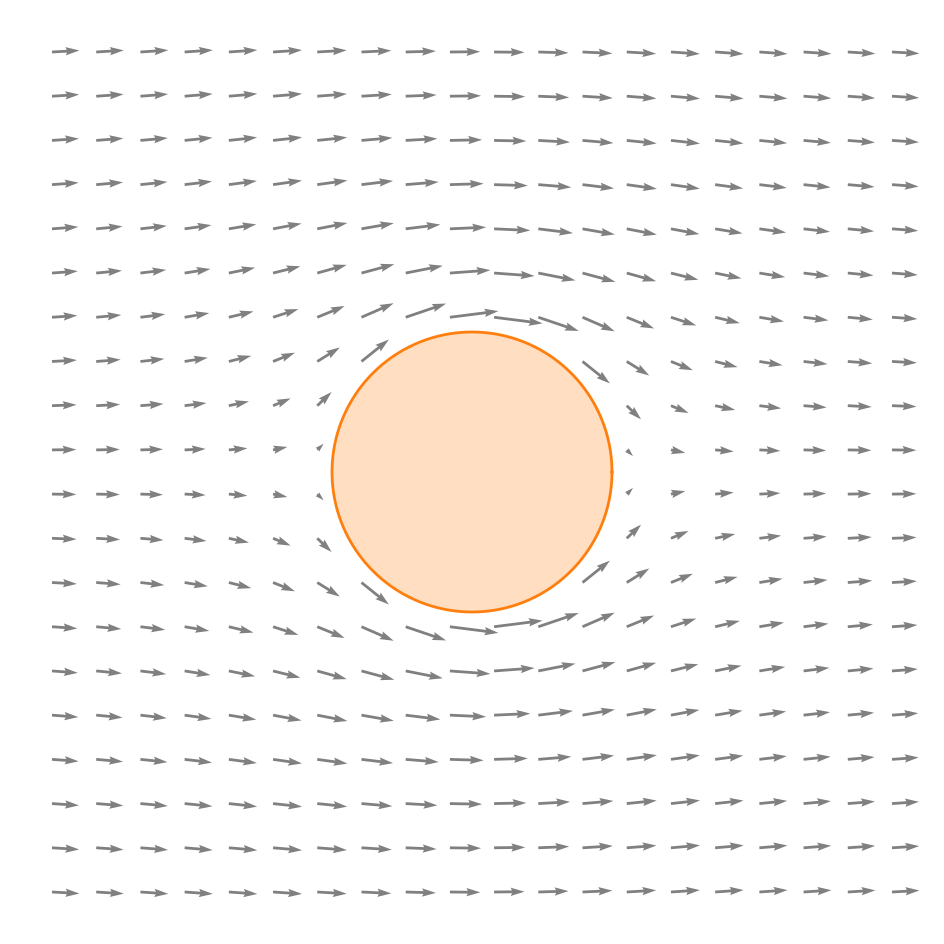

In [37]:
U = 1
C = 0

def f(z):
    return U - U / (z*z) + C / (2j*pi) / z

def v(function):
    def v_(X, Y):
        function_xy = function(X+1j*Y)
        return (function_xy.real, -function_xy.imag)
    return v_

figure(figsize=(12,12))
xs = ys = linspace(-3.0, 3.0, 20)
X, Y = meshgrid(xs, ys)
Vx, Vy = v(f)(X, Y) * (X*X+Y*Y >= 1.0)

quiver(X, Y, Vx, Vy, color="grey")

color = "C1"
theta = linspace(0, 2*pi, 1000)
fill(cos(theta), sin(theta), color="white")
fill(cos(theta), sin(theta), color="C1", alpha=0.25)
plot(cos(theta), sin(theta), color="C1", lw=2)

axis("square")
axis("off")

None


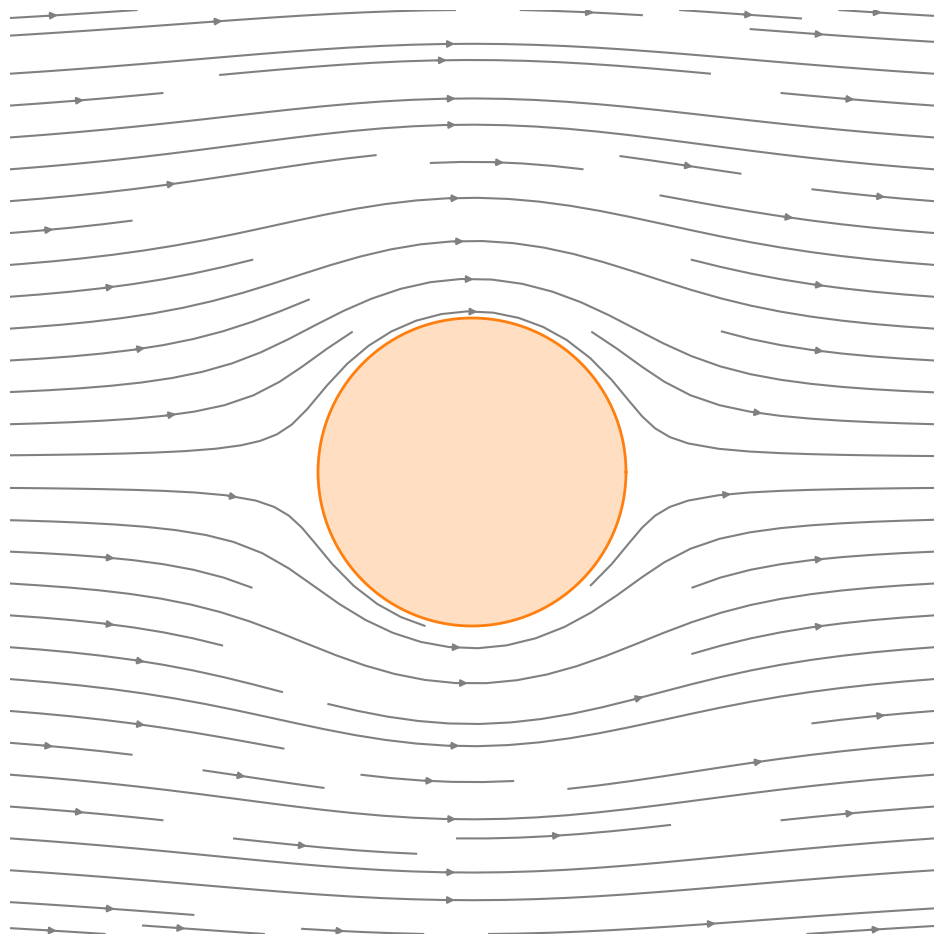

In [38]:
figure(figsize=(12,12))
xs = ys = linspace(-3.0, 3.0, 100)
X, Y = meshgrid(xs, ys)
Vx, Vy = v(f)(X, Y) * (X*X+Y*Y >= 1.0)

streamplot(X, Y, Vx, Vy, color="grey")

theta = linspace(0, 2*pi, 1000)
color = "C1"
fill(cos(theta), sin(theta), color="white")
fill(cos(theta), sin(theta), color="C1", alpha=0.25)
plot(cos(theta), sin(theta), color="C1", lw=2)

axis("square")
axis("off")

None

### Joukowsky Transformation and its inverse

$$
w = J(z) = \frac{1}{2}\left(z + \frac{1}{z}\right)
$$

$$
z^2 - 2w z + 1 = 0
$$

$$
\Delta = 4w^2 - 4 = 4(w^2 - 1)
$$

$$
z = \frac{2w \pm \sqrt{\Delta}}{2} = w \pm \sqrt{w^2-1}
$$

If we take into account the pretransformation $z \mapsto a z + b$, the inverse is

$$
z = \frac{w \pm \sqrt{w^2-1} - b}{a}
$$

In [39]:
@vectorize
def J_inv(w):
    s = sqrt(w * w - 1)
    z1 = (w + s - b) / a
    z2 = (w - s - b) / a
    if abs(z1) >= 1.0:
        return z1
    else:
        return z2

In [40]:
def dJ(z):
    v = a * z + b
    return 0.5 * (1 - 1 / (v * v)) * a

In [41]:
@vectorize
def g(w):
    z = J_inv(w)
    return f(z) / dJ(z) 

## Mapping of the complex velocity

We admit (without proof) that for every point $w$ around the airfoil, there is a single $z$ around the unit disk such that $J(z) = w$.

### 🚧 Question

Show that the complex velocity $g$ defined around the airfoil by

$$
g(w) := \frac{f(z)}{J'(z)}
$$

satisfies the tangential boundary conditions around the airfoil.

### 🔓 Solution

The complex velocity $f$ satisfies on the boundary of the unit disk the condition 

$$
\Re \left(f(z) n(z)\right)  =0
$$

where $n(e^{i\theta}) = e^{i\theta}$ is a normal to the boundary of the disk. Now, a normal to the airfoil is given by $J'(z) n(z)$ and thus,

$$
\Re \left(g(w) J'(z) n(z)\right) = \Re \left(\frac{f(z)}{J'(z)} J'(z) n(z)\right)
=
\Re \left(f(z) n(z)\right) = 0.
$$

Thus, the velocity $\overline{g(w)}$ is tangent to the airfoil as expected.



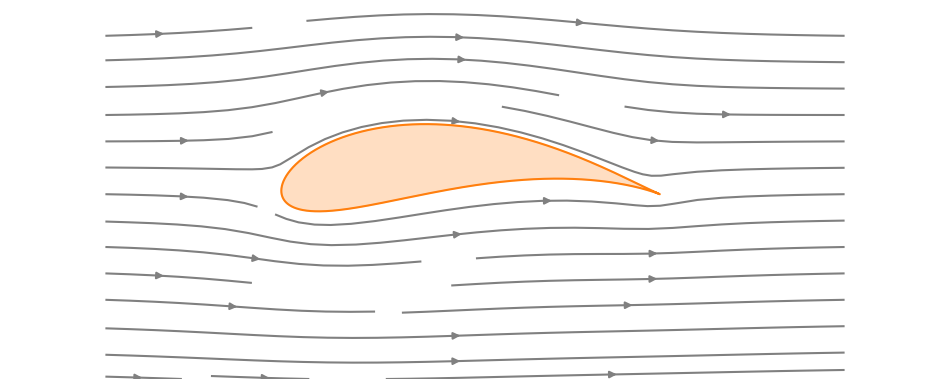

In [42]:
gamma = circle()
J_gamma = lambda t: J(gamma(t))

t = linspace(0.0, 1.0, 1000)

fig = figure()
fig.set_figwidth(12)
color = "C1"
fill(J_gamma(t).real, J_gamma(t).imag, color="white", zorder=10)
fill(J_gamma(t).real, J_gamma(t).imag, color=color, alpha=0.25, zorder=20)
plot(J_gamma(t).real, J_gamma(t).imag, color=color, zorder=30)


def v(function):
    def v_(X, Y):
        function_xy = function(X+1j*Y)
        return (function_xy.real, -function_xy.imag)
    return v_

xs = linspace(-2.0, 2.0, 100)
ys = linspace(-1.0, 1.0, 100)

X, Y = meshgrid(xs, ys)
mask = abs(J_inv(X+1j*Y)) >= 1.0
Vx, Vy = v(g)(X, Y) * mask


streamplot(X, Y, Vx, Vy, density=(1, 0.5), color="grey", zorder=-10)


axis("tight")
axis("equal")
axis("off")

savefig("flow.png")

None

## Domain Coloring

In [43]:
# TODO: collection of functions and small gallery

def Joukowsky(z):
    return 0.5*(z + 1.0 / z)

def f(Z):
    return Z # try several multiplicities, products, ratios, etc.

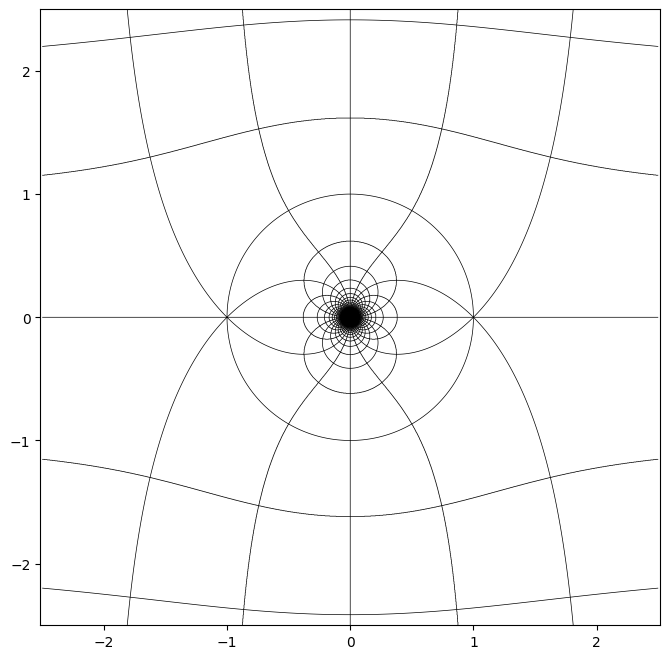

In [44]:
# Honestly, not sure that plotting Re and Im is useful in any way.
# But the rendering is also a bit weird TBH, I should check what's going on.
T = linspace(-2.5, 2.5, 2048)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

# TODO: introduce contour principles beforehand (quadratic function?)
# TODO: display initial grid (aka f(z)=z) and then the mapping.

f = Joukowsky # exp
W = f(Z)

figure(figsize=(8, 8))
xlim(-2.5, 2.5)
ylim(-2.5, 2.5)
# document "trick" to get all integer levels
contour(X, Y, W.real - round(W.real), levels=[0.0], colors="black", linewidths=0.5)
contour(X, Y, W.imag - round(W.imag), levels=[0.0], colors="black", linewidths=0.5)
axis("equal")
ax = gca()
# ax.set_xticks([])
# ax.set_yticks([])
None


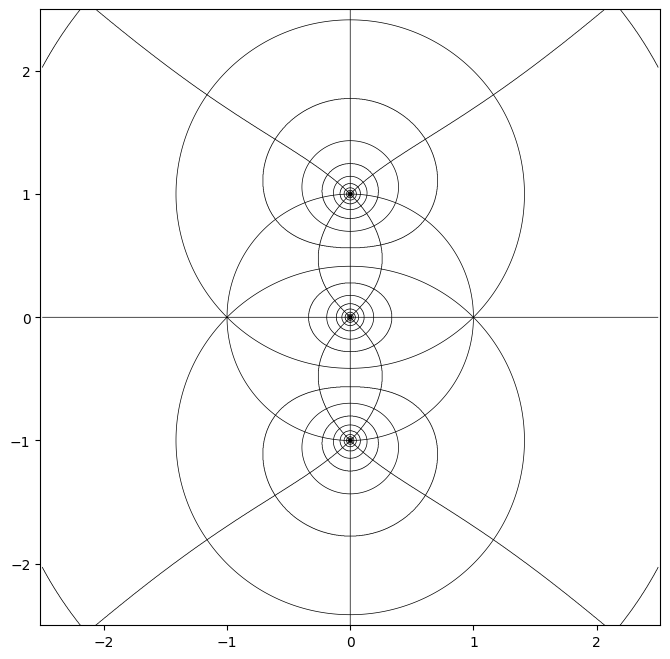

In [45]:
T = linspace(-2.5, 2.5, 2048)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

f = Joukowsky
W = f(Z)
L = log(abs(W)) # symmetric for poles & zeros
N = 2
A = (angle(W)/pi) * N #  multiples of pi/N mapped to integers

figure(figsize=(8, 8))
xlim(-2.5, 2.5)
ylim(-2.5, 2.5)
# document "trick" to get all integer levels
contour(X, Y, L - round(L), levels=[0.0], colors="black", linewidths=0.5)
contour(X, Y, A - round(A), levels=[0.0], colors="black", linewidths=0.5)
axis("equal")
ax = gca()
# ax.set_xticks([])
# ax.set_yticks([])
None

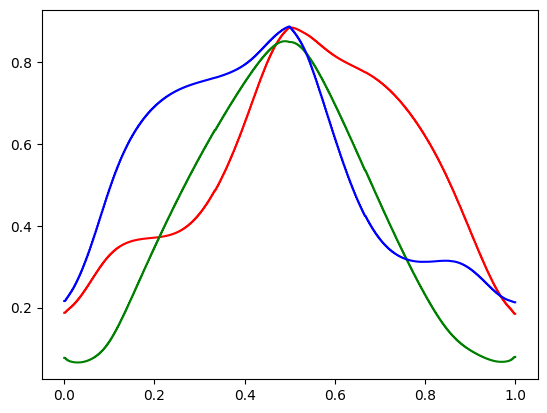

In [46]:

colormap = twilight = colormaps["twilight_shifted"]
u = linspace(0.0, 1.0, 1024)
RGBA = colormap(u)  # float64, but discretised (8-bit)
RGB = RGBA[:, :3]
plot(u, RGB[:, 0], color="red")
plot(u, RGB[:, 1], color="green")
plot(u, RGB[:, 2], color="blue")


def shifted_twilight(u):
    return twightlight(u - 0.5 % 1)
None

# NOTA: we can deliver a RBGA array to imshow, that works! 👍


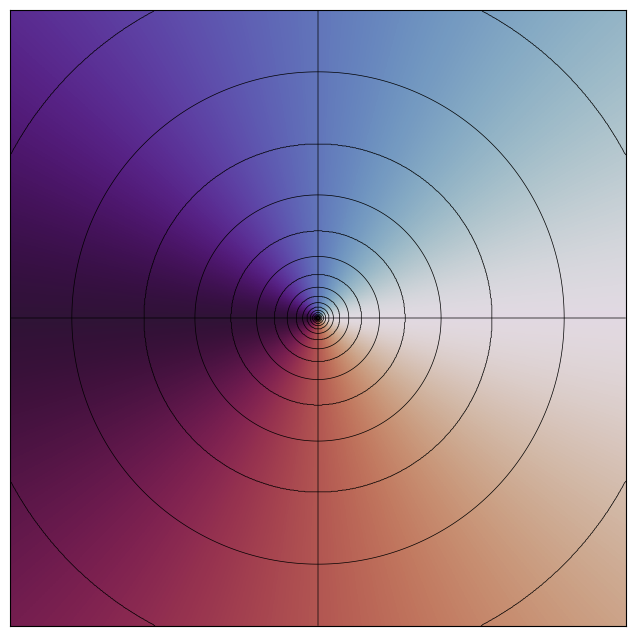

In [47]:
T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = Z

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)
ax.set_xticks([])
ax.set_yticks([])

None

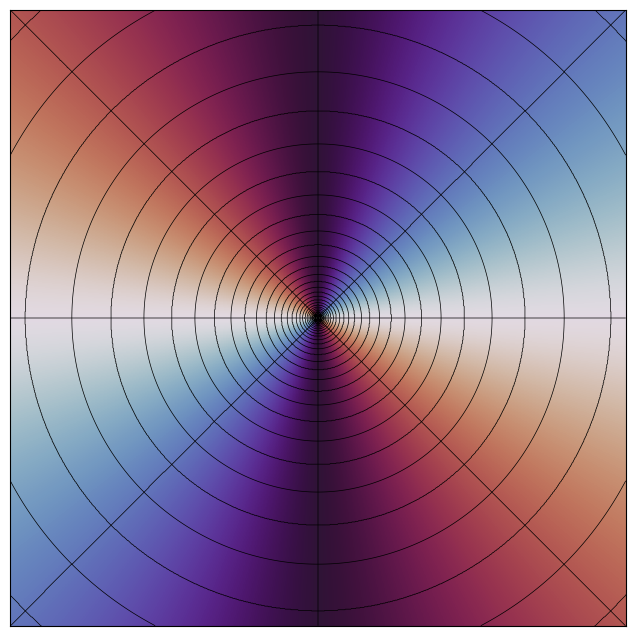

In [48]:
T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = Z**2

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)

ax.set_xticks([])
ax.set_yticks([])


None

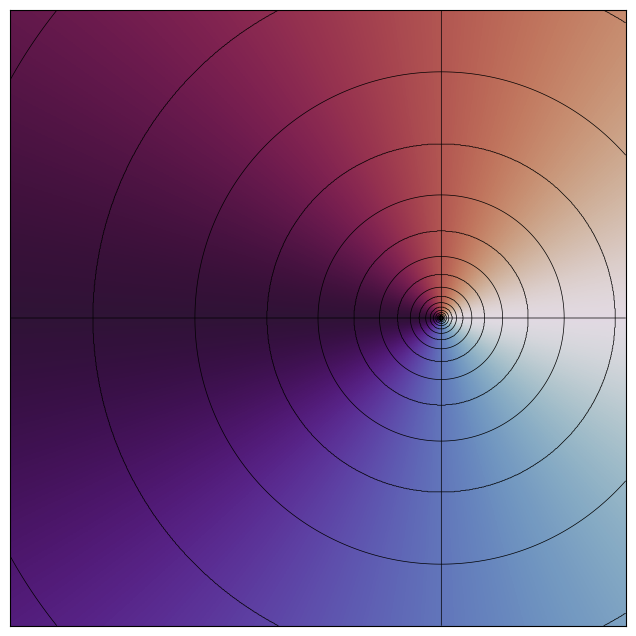

In [49]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = 1/(Z-1)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)
ax.set_xticks([])
ax.set_yticks([])

None

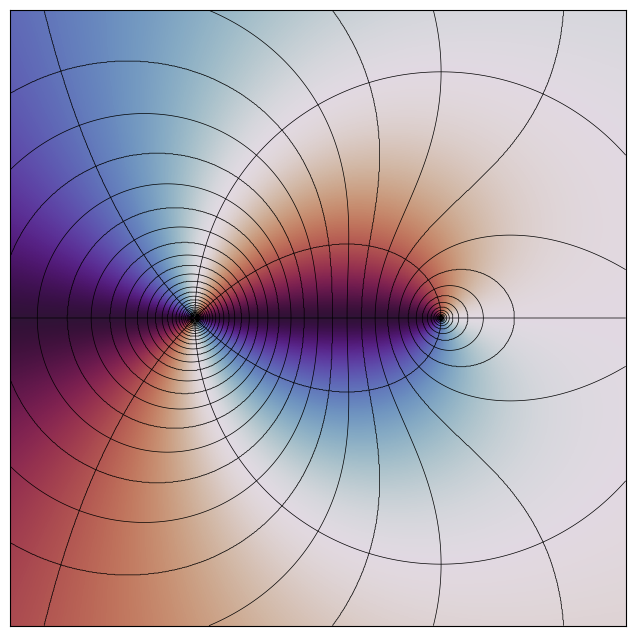

In [50]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = (Z+1)**2/(Z-1)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)
ax.set_xticks([])
ax.set_yticks([])
savefig("image.png")
None

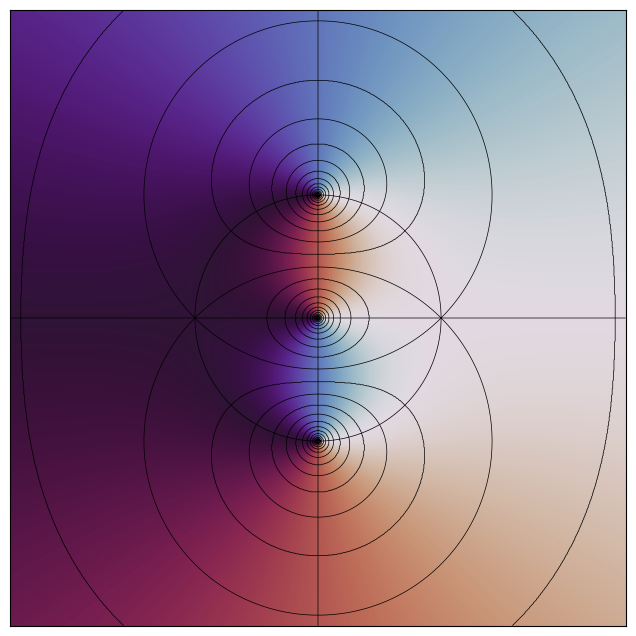

In [51]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = 0.5*(Z+1/Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)
ax.set_xticks([])
ax.set_yticks([])

None

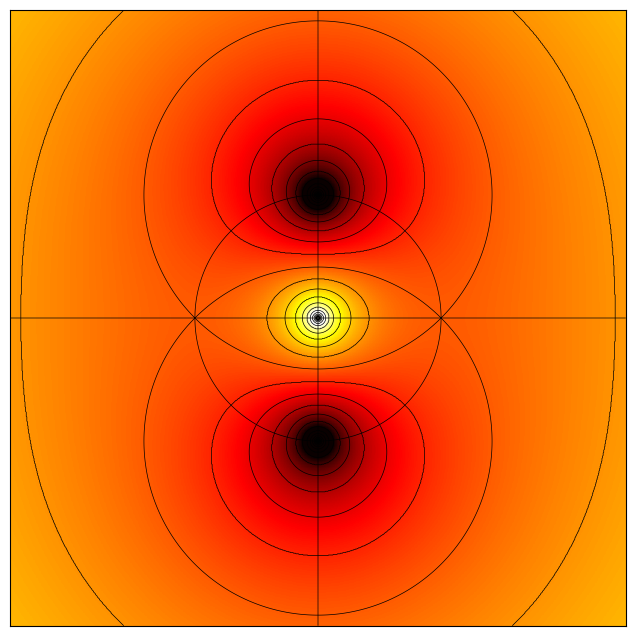

In [52]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = 0.5*(Z+1/Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    L,
    interpolation="nearest",
    cmap="hot", #"twilight", #"twilight", #"Spectral",
    vmin=-3, vmax=3,
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)
ax.set_xticks([])
ax.set_yticks([])

None

/tmp/ipykernel_65285/3540161739.py:7: RuntimeWarning: overflow encountered in exp
  W = exp(1/Z)
/tmp/ipykernel_65285/3540161739.py:12: RuntimeWarning: divide by zero encountered in log2
  L = log2(abs(W))
/tmp/ipykernel_65285/3540161739.py:28: RuntimeWarning: invalid value encountered in subtract
  ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5, alpha=0)


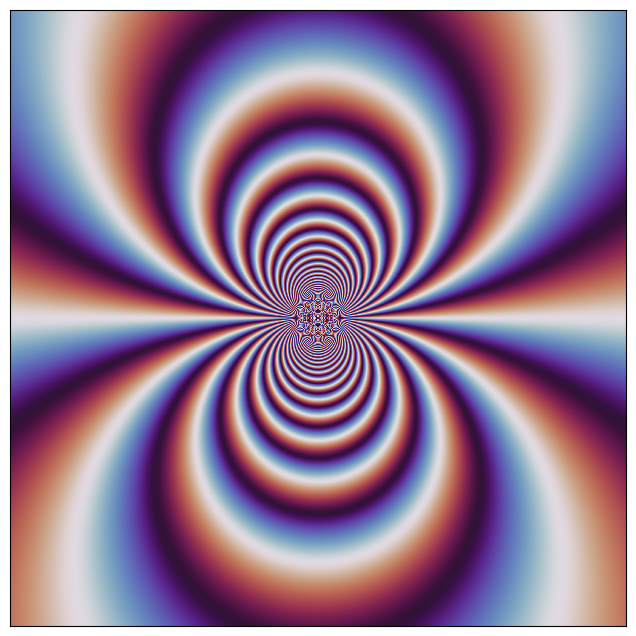

In [53]:
# TODO: 

T = linspace(-0.1, 0.1, 4096)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = exp(1/Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5, alpha=0)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5, alpha=0)
ax.set_xticks([])
ax.set_yticks([])

None

/tmp/ipykernel_65285/1073645911.py:7: RuntimeWarning: overflow encountered in sin
  W = sin(1/Z)
/tmp/ipykernel_65285/1073645911.py:28: RuntimeWarning: invalid value encountered in subtract
  ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5, alpha=0)


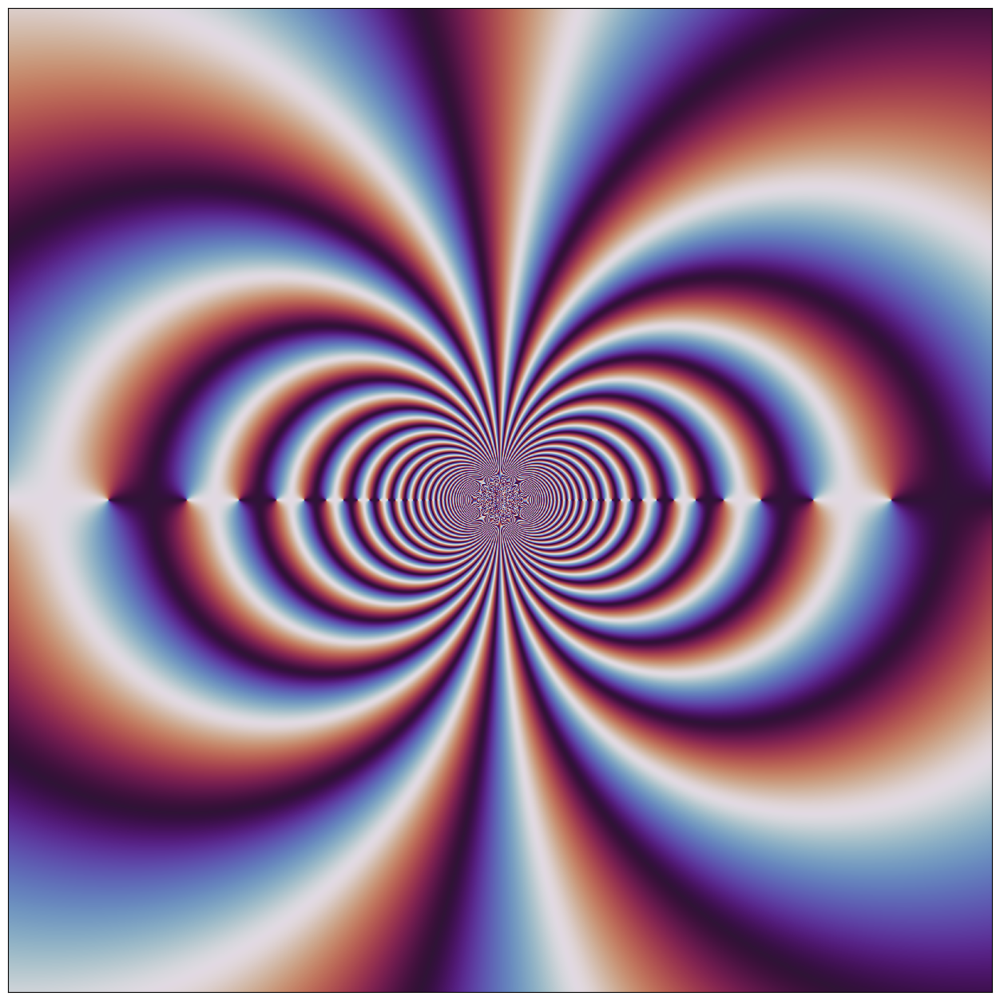

In [54]:
# TODO: 

T = linspace(-0.1, 0.1, 4096)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = sin(1/Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


figure(figsize=(16, 16))
ax = gca()
ax.set_facecolor("white")

im = ax.imshow(
    A,
    interpolation="nearest",
    cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5, alpha=0)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5, alpha=0)
ax.set_xticks([])
ax.set_yticks([])

None

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.595744707788022..1.6462813872116024].


<Figure size 640x480 with 0 Axes>

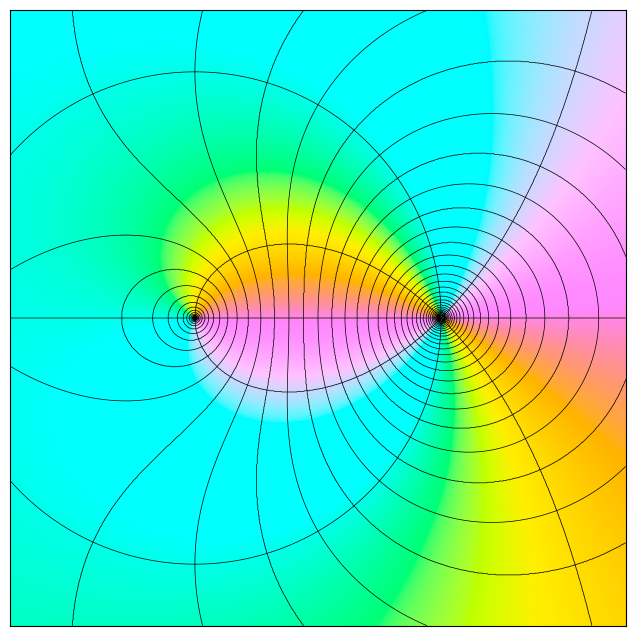

In [55]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = (Z - 1)**2 / (Z+1) # Z # Joukowsky(Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))

J = ones_like(A, dtype=float)
C = ones_like(A, dtype=float)
h = A
JCh = zeros(shape(A) + (3,))
JCh[:,:,0] = 90.0 * J
JCh[:,:,1] = 90.0 * C
JCh[:,:,2] = h / pi * 180.0
RGB = colorspacious.cspace_convert(JCh, "JCh","sRGB1")


clf()
_ = figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")



im = ax.imshow(
    RGB,
    interpolation="nearest",
    #cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
ax.contour(L - round(L), [0.0], colors="black", linewidths=0.5)

ax.set_xticks([])
ax.set_yticks([])

None

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.595744707638976..1.6462813872203557].


<Figure size 640x480 with 0 Axes>

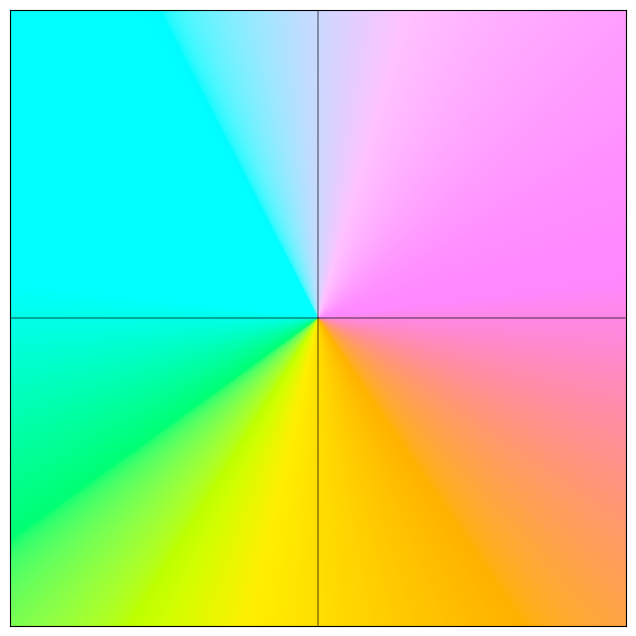

In [56]:
# TODO: 

T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = Z # Z # Joukowsky(Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))


import colorspacious
J = ones_like(A, dtype=float)
C = abs(W)/(1 + abs(W))
h = A
JCh = zeros(shape(A) + (3,))
JCh[:,:,0] = 90.0
JCh[:,:,1] = 90.0 
JCh[:,:,2] = h / pi * 180.0
RGB = colorspacious.cspace_convert(JCh, "JCh","sRGB1")

# print(RGB)

clf()
_ = figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")



im = ax.imshow(
    RGB,
    interpolation="nearest",
    #cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

ax.contour(An - round(An), [0.0], colors="black", linewidths=0.5)
# ax.contour(L - round_(L), [0.0], colors="black", linewidths=0.5)

ax.set_xticks([])
ax.set_yticks([])

None

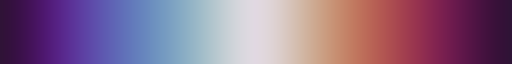

In [57]:
from matplotlib import colormaps
cm = colormaps["twilight_shifted"]
cm

In [58]:
cm([[[0.0], [0.5], [1.0]]])

array([[[[0.18739228, 0.0771021 , 0.21618875, 1.        ]],

        [[0.88571155, 0.85002186, 0.88572539, 1.        ]],

        [[0.18488036, 0.07942573, 0.21307652, 1.        ]]]])

/home/boisgera/VOYAGER/ENS/COMPLEX-ANALYSIS/DOMAIN-COLORING/.venv/lib/python3.11/site-packages/colorspacious/ciecam02.py:397: RuntimeWarning: invalid value encountered in power
  * ((27.13 * np.abs(RGBprime_a - 0.1))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-409275959193.60785..56990.1159664289].


<Figure size 640x480 with 0 Axes>

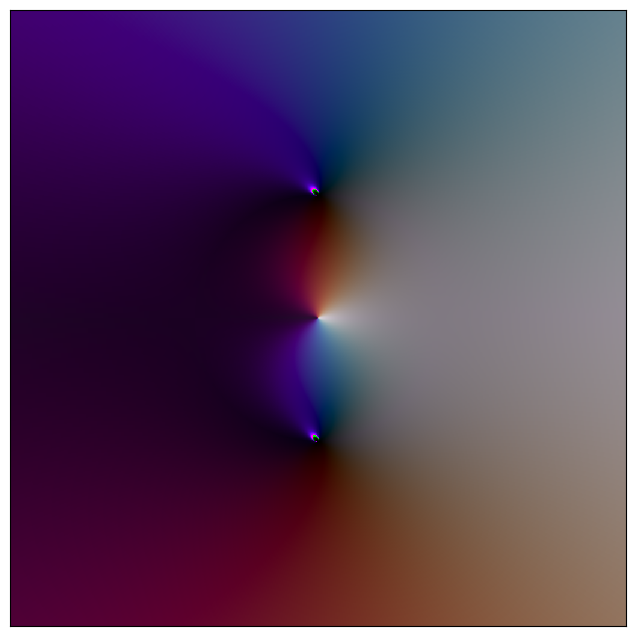

In [59]:
T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = 0.5 * (Z +1/Z) # Z # Joukowsky(Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))

RGBA = cm(0.5 + 0.5*A/pi)
RGB = RGBA[:,:,:3]
JCh = colorspacious.cspace_convert(RGB, "sRGB1", "JCh")
J = JCh[:,:, 0]
C = JCh[:,:, 1]
h = JCh[:,:, 2]

JCh = zeros(shape(A) + (3,))
JCh[:,:,0] = J * abs(W)/(1.0+abs(W))
JCh[:,:,1] =  C
JCh[:,:,2] = h
RGB = colorspacious.cspace_convert(JCh, "JCh","sRGB1")

# print(RGBA)

clf()
_ = figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")



im = ax.imshow(
    RGB,
    interpolation="nearest",
    #cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

#ax.contour(An - round_(An), [0.0], colors="black", linewidths=0.5)
# ax.contour(L - round_(L), [0.0], colors="black", linewidths=0.5)

ax.set_xticks([])
ax.set_yticks([])

None

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-409275959193.60785..56990.1159664289].


<Figure size 640x480 with 0 Axes>

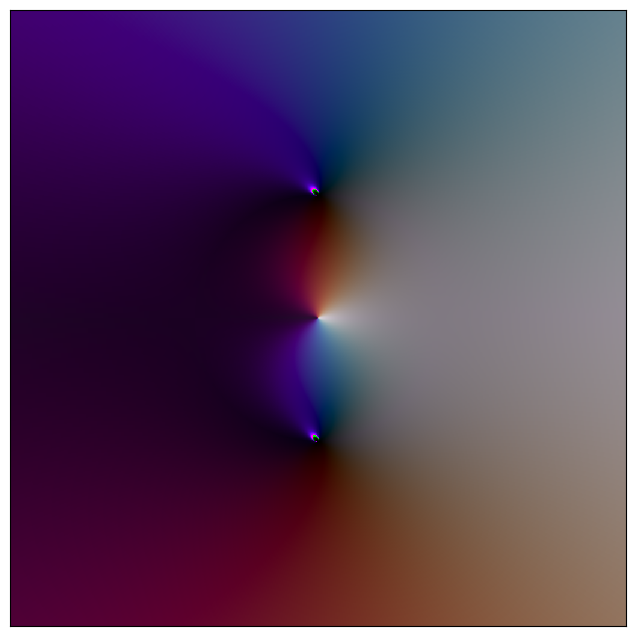

In [60]:
T = linspace(-2.5, 2.5, 1024)
X, Y = meshgrid(T, T)
Z = X + 1j * Y

W = 0.5 * (Z +1/Z) # Z # Joukowsky(Z)

A = angle(W)
N = 2
An = (A / 2 / pi) * N
L = log2(abs(W))

RGBA = cm(0.5 + 0.5*A/pi)
RGB = RGBA[:,:,:3]
JCh = colorspacious.cspace_convert(RGB, "sRGB1", "JCh")
J = JCh[:,:, 0]
C = JCh[:,:, 1]
h = JCh[:,:, 2]

JCh = zeros(shape(A) + (3,))
JCh[:,:,0] = J * abs(W)/(1.0+abs(W))
JCh[:,:,1] =  C
JCh[:,:,2] = h
RGB = colorspacious.cspace_convert(JCh, "JCh","sRGB1")

# print(RGBA)

clf()
_ = figure(figsize=(8, 8))
ax = gca()
ax.set_facecolor("white")



im = ax.imshow(
    RGB,
    interpolation="nearest",
    #cmap="twilight_shifted", #"twilight", #"twilight", #"Spectral",
    rasterized=True,
    alpha=1.0,
)

#ax.contour(An - round_(An), [0.0], colors="black", linewidths=0.5)
# ax.contour(L - round_(L), [0.0], colors="black", linewidths=0.5)

ax.set_xticks([])
ax.set_yticks([])

None